# NX414 - MINI PROJECT - Notebook
Myriam HAMON and David MARTIN-OSORIO

In [1]:
# --- Imports ---

# -- Preliminary part --
import sys
from utils import load_it_data, visualize_img
import matplotlib.pyplot as plt
import numpy as np
import gdown

# -- Part 1 --
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.metrics import explained_variance_score
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.linear_model import RidgeCV
import matplotlib.ticker

# -- Part 2 --
import torchvision.models as models
import torch
import torchvision.transforms as transforms
from torchvision.models.feature_extraction import create_feature_extractor
from sklearn.decomposition import PCA, IncrementalPCA
import warnings
import sklearn.metrics
import sklearn.linear_model

# -- Part 3 --
from torch.utils.data import Dataset, DataLoader
from PIL import Image
from torchvision import transforms
import torch.nn as nn
import torch.nn.functional as F
import sklearn.metrics
from tqdm import tqdm
import pandas as pd



In [ ]:
!{sys.executable} -m pip install gdown h5py

In [ ]:
url = "https://drive.google.com/file/d/1s6caFNRpyR9m7ZM6XEv_e8mcXT3_PnHS/view?usp=share_link"
output = "IT_data.h5"
gdown.download(url, output, quiet=False, fuzzy=True)

Downloading...
From (original): https://drive.google.com/uc?id=1s6caFNRpyR9m7ZM6XEv_e8mcXT3_PnHS
From (redirected): https://drive.google.com/uc?id=1s6caFNRpyR9m7ZM6XEv_e8mcXT3_PnHS&confirm=t&uuid=d081ad72-3950-463d-9c0c-719868d4b353
To: /content/IT_data.h5
100%|██████████| 384M/384M [00:14<00:00, 26.9MB/s]


'IT_data.h5'

# Loading the data :

In [2]:
path_to_data = '' ## Insert the folder where the data is, if you download in the same folder as this notebook then leave it blank
stimulus_train, stimulus_val, stimulus_test, objects_train, objects_val, objects_test, spikes_train, spikes_val = load_it_data(path_to_data)

In [5]:
n_stimulus, n_channels, img_size, _ = stimulus_train.shape
_, n_neurons = spikes_train.shape
print('The train dataset contains {} stimuli and {} IT neurons'.format(n_stimulus,n_neurons))
print('Each stimulus have {} channgels (RGB)'.format(n_channels))
print('The size of the image is {}x{}'.format(img_size,img_size))

The train dataset contains 2592 stimuli and 168 IT neurons
Each stimulus have 3 channgels (RGB)
The size of the image is 224x224


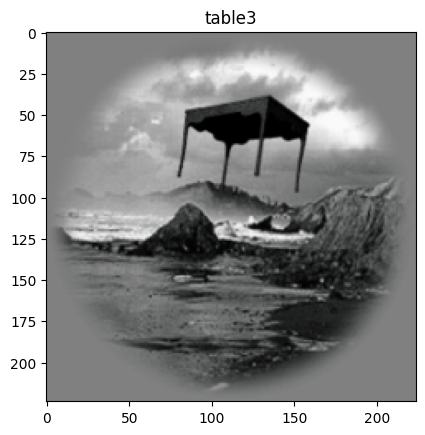

In [6]:
stim_idx = 1

visualize_img(stimulus_train,objects_train,stim_idx)

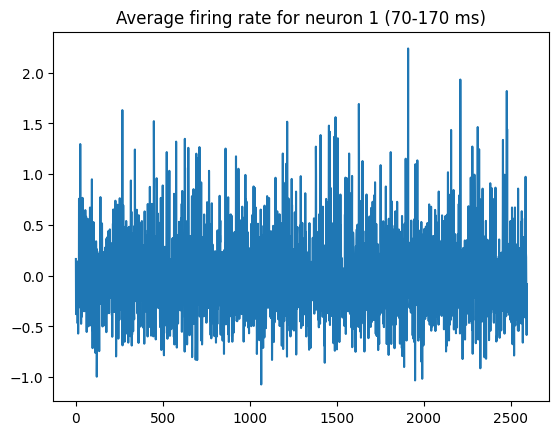

In [ ]:
neuron_idx = 1

plt.figure()
plt.title('Average firing rate for neuron {} (70-170 ms)'.format(neuron_idx))
plt.plot(spikes_train[:,neuron_idx])

# Part 1 - Predicting neural activity from pixels

In [7]:
# --- Reshape the data ---
stimulus_train_flatten = stimulus_train.reshape(stimulus_train.shape[0], -1)
stimulus_val_flatten = stimulus_val.reshape(stimulus_val.shape[0], -1)

# --- Train Linear Regression model (OLS) ---
ols = LinearRegression()
ols.fit(stimulus_train_flatten, spikes_train)

# --- Train Linear Regression model (ridge) ---
ridge = Ridge()
ridge.fit(stimulus_train_flatten, spikes_train)

# --- Score of Linear Regression models ---
print(f"OLS score on training data  = {ols.score(stimulus_train_flatten, spikes_train)}")
print(f"OLS score on validation data  = {ols.score(stimulus_val_flatten, spikes_val)}")

print("")

# --- Score of Linear Regression models ---
print(f"Ridge score on training data  = {ridge.score(stimulus_train_flatten, spikes_train)}")
print(f"Ridge score on validation data  = {ridge.score(stimulus_val_flatten, spikes_val)}")

c:\Users\mhamon\NX_project\.venv\lib\site-packages\sklearn\linear_model\_ridge.py:252: LinAlgWarning: Ill-conditioned matrix (rcond=5.14211e-09): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


OLS score on training data  = 0.3549266457557678
OLS score on validation data  = -0.037407081574201584

Ridge score on training data  = 0.9999988079071045
Ridge score on validation data  = -1.1670763492584229


TORUN The linear regression (OLS) doesn't seem to work properly, as the training score is quite low and the validation score is negative.
The ridge regression manages to fit the training data almost perfectly, but performs poorly on the validation data, indicating overfitting.

## Further evaluation of our prediction :

In [8]:
# --- Predictions ---
# --- OLS ---
spikes_pred_train_ols = ols.predict(stimulus_train_flatten)
spikes_pred_val_ols = ols.predict(stimulus_val_flatten)
# --- Ridge ---
spikes_pred_train_ridge = ridge.predict(stimulus_train_flatten)
spikes_pred_val_ridge = ridge.predict(stimulus_val_flatten)


# --- Explained variance score for each neuron ---
# --- OLS ---
ev_train_ols = explained_variance_score(spikes_train, spikes_pred_train_ols, multioutput='raw_values')
ev_val_ols = explained_variance_score(spikes_val, spikes_pred_val_ols, multioutput='raw_values')
# --- Ridge ---
ev_train_ridge = explained_variance_score(spikes_train, spikes_pred_train_ridge, multioutput='raw_values')
ev_val_ridge = explained_variance_score(spikes_val, spikes_pred_val_ridge, multioutput='raw_values')

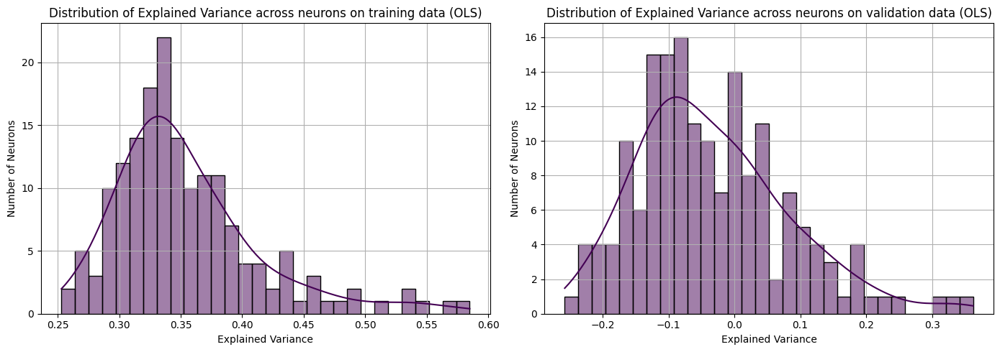

Mean explained variance -0.033401422


In [33]:
# --- Plot distributions of explained variance (OLS) ---
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Distribution of Explained Variance : Training data
sns.histplot(ev_train_ols, bins=30, kde=True, ax=axes[0])
axes[0].set_xlabel("Explained Variance")
axes[0].set_ylabel("Number of Neurons")
axes[0].set_title("Distribution of Explained Variance across neurons on training data (OLS)")
axes[0].grid(True)

# Distribution of Explained Variance : Validation data
sns.histplot(ev_val_ols, bins=30, kde=True, ax=axes[1])
axes[1].set_xlabel("Explained Variance")
axes[1].set_ylabel("Number of Neurons")
axes[1].set_title("Distribution of Explained Variance across neurons on validation data (OLS)")
axes[1].grid(True)

plt.tight_layout()
plt.show()
print('Mean explained variance ' + str(np.mean(ev_val_ols)))

TORUN **For OLS Regression**: <br>
The distribution of explained variance scores across neurons for the training data is narrow and centered around 0.33, indicating a poor fit. <br>
On the validation data, the scores are mostly negative, meaning the model performs worse than a baseline that simply predicts the mean of the target distribution.<br>
This suggests that the model is too simple for the task and generalizes poorly to unseen data.

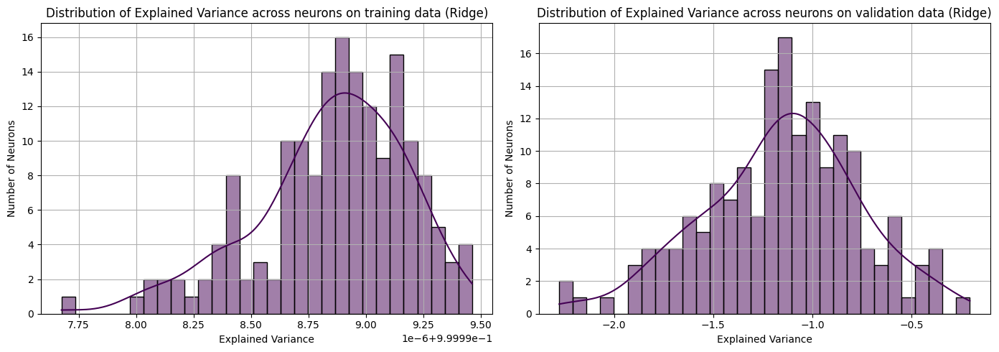

Mean explained variance -1.1574075


In [34]:
# --- Plot distributions of explained variance (Ridge) ---
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Distribution of Explained Variance : Training data
sns.histplot(ev_train_ridge, bins=30, kde=True, ax=axes[0])
axes[0].set_xlabel("Explained Variance")
axes[0].set_ylabel("Number of Neurons")
axes[0].set_title("Distribution of Explained Variance across neurons on training data (Ridge)")
#axes[0].xasis.set_major_formatter(ticker.FormatStrFormatter('%.7'))
axes[0].grid(True)

# Distribution of Explained Variance : Validation data
sns.histplot(ev_val_ridge, bins=30, kde=True, ax=axes[1])
axes[1].set_xlabel("Explained Variance")
axes[1].set_ylabel("Number of Neurons")
axes[1].set_title("Distribution of Explained Variance across neurons on validation data (Ridge)")
axes[1].grid(True)

plt.tight_layout()
plt.show()
print('Mean explained variance ' + str(np.mean(ev_val_ridge)))

**For Ridge Regression** : <br>
The distribution of explained variance scores across neurons for the training data is narrow and centered around 1, indicating a high-quality fit.<br>
In contrast, the scores on the validation data are negative, meaning the model performs worse than a baseline that simply predicts the mean of the target distribution. <br>
This confirms that the model has overfitted the training data and generalizes poorly to unseen data.

**General Interpretation of the Correlation Matrix**

The correlation matrix is computed using `np.corrcoef`, which calculates the Pearson correlation coefficients between all pairs of columns from both matrices (true and predicted neuron traces).

- **Top-left quadrant**: Correlations among the true neuron traces.  
- **Bottom-right quadrant**: Correlations among the predicted neuron traces.  
- **Top-right quadrant**: Correlations between each true neuron trace and each predicted neuron trace.  
- **Bottom-left quadrant**: Same as the top-right quadrant; it is its transpose.

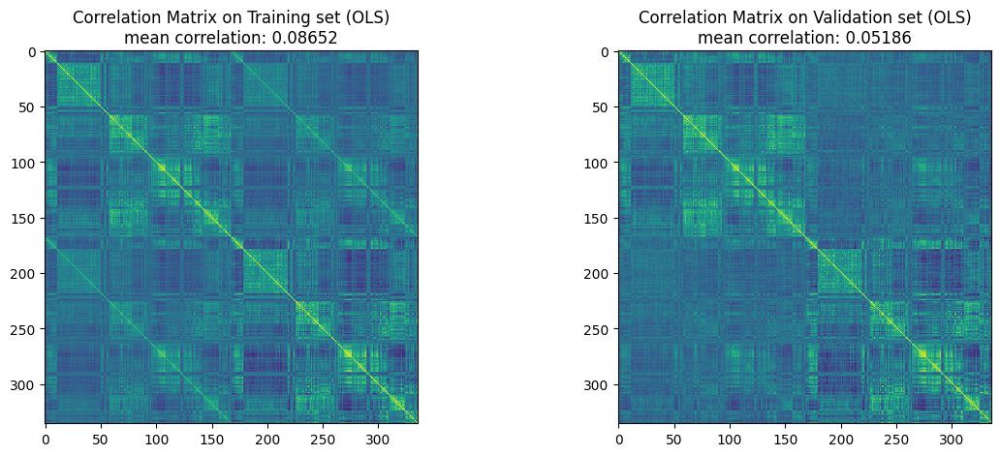

In [10]:
# --- Correlation for OLS ---
corr_matrix_train_ols = np.corrcoef(spikes_train, spikes_pred_train_ols, rowvar=False)
corr_matrix_val_ols = np.corrcoef(spikes_val, spikes_pred_val_ols, rowvar=False)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].imshow(corr_matrix_train_ols)
axes[0].set_title(f"Correlation Matrix on Training set (OLS)\nmean correlation: {round(np.mean(corr_matrix_train_ols), 5)}")
axes[1].imshow(corr_matrix_val_ols)
axes[1].set_title(f"Correlation Matrix on Validation set (OLS)\nmean correlation: {round(np.mean(corr_matrix_val_ols), 5)}")

plt.show()

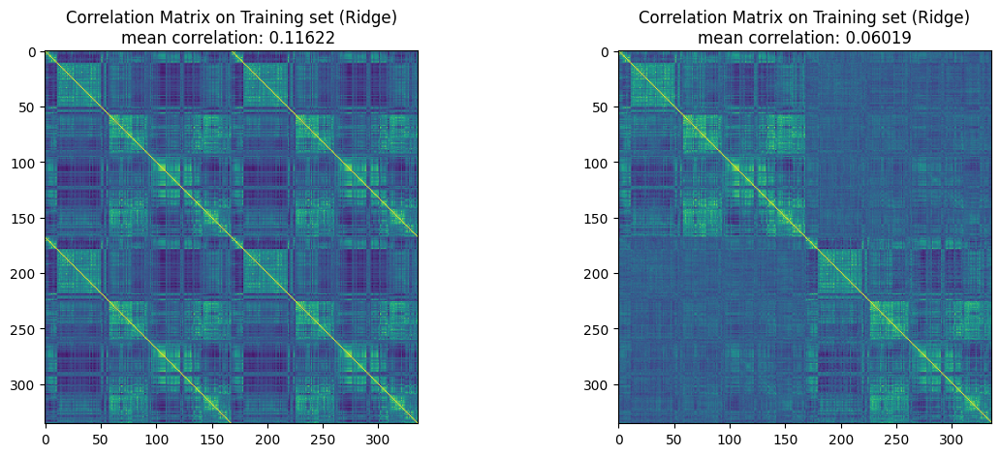

In [ ]:
# --- Correlation for Ridge ---
corr_matrix_train_ridge = np.corrcoef(spikes_train, spikes_pred_train_ridge, rowvar=False)
corr_matrix_val_ridge = np.corrcoef(spikes_val, spikes_pred_val_ridge, rowvar=False)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].imshow(corr_matrix_train_ridge)
axes[0].set_title(f"Correlation Matrix on Training set (Ridge)\nmean correlation: {round(np.mean(corr_matrix_train_ridge), 5)} ")
axes[1].imshow(corr_matrix_val_ridge)
axes[1].set_title(f"Correlation Matrix on Training set (Ridge)\nmean correlation: {round(np.mean(corr_matrix_val_ridge), 5)}")
plt.show()

 **For Both Regressions**: <br>
The autocorrelations (diagonal quadrants) are similar for both the training and validation data, indicating consistent internal structure within each set. <br>
However, in the validation data, there is little to no correlation between the true and predicted neuron traces (off-diagonal quadrants), once again highlighting that the model has overfitted the training data and fails to generalize to unseen examples.


## We retain the corresponding 1000 PCs and use them to predict the neural activity :

In [11]:
# --- Fit PCA on training stimuli ---
pca = PCA(n_components=1000)
pca.fit(stimulus_train_flatten)

# --- Transform stimuli using PCA ---
stimulus_train_pca = pca.transform(stimulus_train_flatten)
stimulus_val_pca = pca.transform(stimulus_val_flatten)

# --- Fit the a liner models on PCA-transformed data ---
ols_pca = LinearRegression()
ols_pca.fit(stimulus_train_pca, spikes_train)

ridge_pca = Ridge()
ridge_pca.fit(stimulus_train_pca, spikes_train)

# --- Score of Linear Regression models after PCA ---
print(f"OLS score on training data after PCA  = {ols_pca.score(stimulus_train_pca, spikes_train)}")
print(f"OLS score on validation data after PCA  = {ols_pca.score(stimulus_val_pca, spikes_val)}")

print("")

# --- Score of Linear Regression models after PCA ---
print(f"Ridge score on training data after PCA  = {ridge_pca.score(stimulus_train_pca, spikes_train)}")
print(f"Ridge score on validation data after PCA  = {ridge_pca.score(stimulus_val_pca, spikes_val)}")


OLS score on training data after PCA  = 0.46257486939430237
OLS score on validation data after PCA  = -0.08943258970975876

Ridge score on training data after PCA  = 0.46257486939430237
Ridge score on validation data after PCA  = -0.08941257745027542


Although PCA has reduced the model complexity by lowering the dimensionality of the data, both models still appear to overfit.<br>
The scores are now nearly identical, indicating that reducing the feature space has not fully addressed the generalization issue.

## Further evaluation of our prediction after PCA :

In [35]:
# --- Predictions after PCA ---
# --- OLS ---
spikes_pred_train_ols_pca = ols_pca.predict(stimulus_train_pca)
spikes_pred_val_ols_pca = ols_pca.predict(stimulus_val_pca)
# --- Ridge ---
spikes_pred_train_ridge_pca = ridge_pca.predict(stimulus_train_pca)
spikes_pred_val_ridge_pca = ridge_pca.predict(stimulus_val_pca)


# --- Explained variance score for each neuron after PCA ---
# --- OLS ---
ev_train_ols_pca = explained_variance_score(spikes_train, spikes_pred_train_ols_pca, multioutput='raw_values')
ev_val_ols_pca = explained_variance_score(spikes_val, spikes_pred_val_ols_pca, multioutput='raw_values')
# --- Ridge ---
ev_train_ridge_pca = explained_variance_score(spikes_train, spikes_pred_train_ridge_pca, multioutput='raw_values')
ev_val_ridge_pca = explained_variance_score(spikes_val, spikes_pred_val_ridge_pca, multioutput='raw_values')

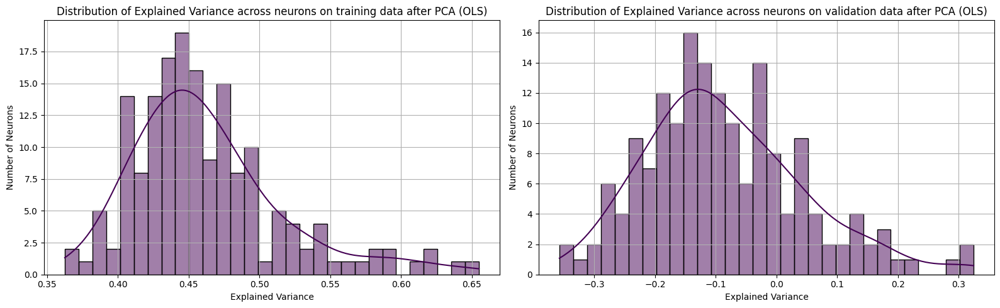

Mean explained variance -0.08550187


In [36]:
# --- Plot distributions of explained variance after PCA (OLS) ---
fig, axes = plt.subplots(1, 2, figsize=(16, 5))

# Distribution of Explained Variance : Training data
sns.histplot(ev_train_ols_pca, bins=30, kde=True, ax=axes[0])
axes[0].set_xlabel("Explained Variance")
axes[0].set_ylabel("Number of Neurons")
axes[0].set_title("Distribution of Explained Variance across neurons on training data after PCA (OLS)")
axes[0].grid(True)

# Distribution of Explained Variance : Validation data
sns.histplot(ev_val_ols_pca, bins=30, kde=True, ax=axes[1])
axes[1].set_xlabel("Explained Variance")
axes[1].set_ylabel("Number of Neurons")
axes[1].set_title("Distribution of Explained Variance across neurons on validation data after PCA (OLS)")
axes[1].grid(True)

plt.tight_layout()
plt.show()

print('Mean explained variance ' + str(np.mean(ev_val_ols_pca)))


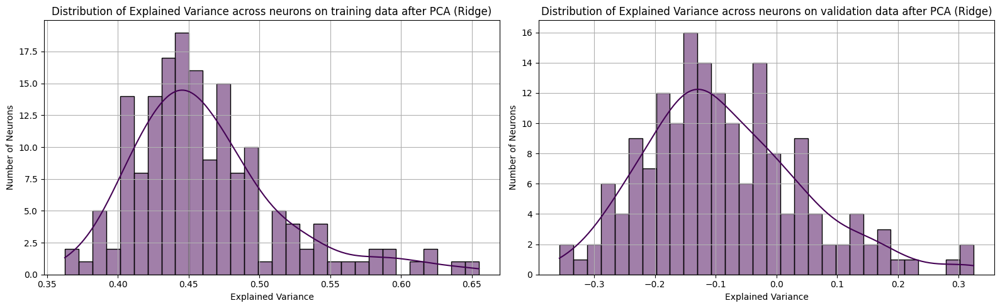

Mean explained variance -0.08548193


In [37]:
# --- Plot distributions of explained variance after PCA (Ridge) ---
fig, axes = plt.subplots(1, 2, figsize=(16, 5))

# Distribution of Explained Variance : Training data
sns.histplot(ev_train_ridge_pca, bins=30, kde=True, ax=axes[0])
axes[0].set_xlabel("Explained Variance")
axes[0].set_ylabel("Number of Neurons")
axes[0].set_title("Distribution of Explained Variance across neurons on training data after PCA (Ridge)")
axes[0].grid(True)

# Distribution of Explained Variance : Validation data
sns.histplot(ev_val_ridge_pca, bins=30, kde=True, ax=axes[1])
axes[1].set_xlabel("Explained Variance")
axes[1].set_ylabel("Number of Neurons")
axes[1].set_title("Distribution of Explained Variance across neurons on validation data after PCA (Ridge)")
axes[1].grid(True)

plt.tight_layout()
plt.show()
print('Mean explained variance ' + str(np.mean(ev_val_ridge_pca)))


The distributions of explained variance further confirm that the 
overfitting issue persists even after reducing model complexity.

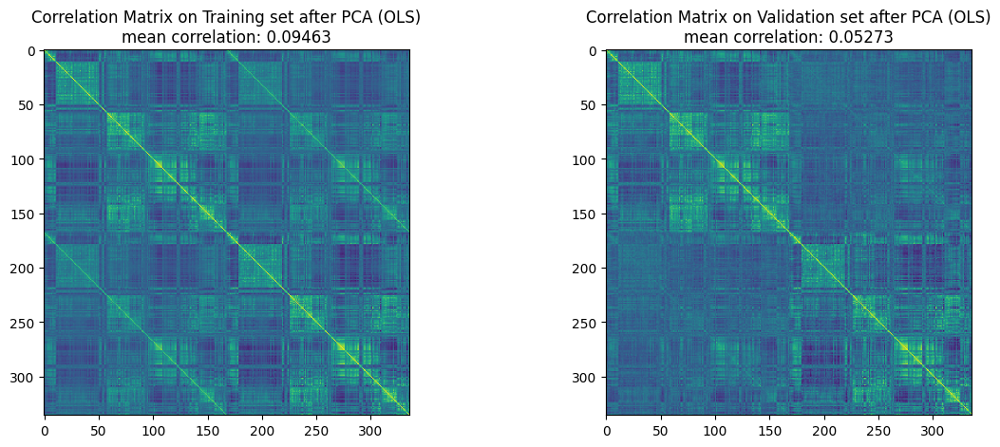

In [14]:
# --- Correlation for OLS after PCA ---
corr_matrix_train_ols_pca = np.corrcoef(spikes_train, spikes_pred_train_ols_pca, rowvar=False)
corr_matrix_val_ols_pca = np.corrcoef(spikes_val, spikes_pred_val_ols_pca, rowvar=False)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].imshow(corr_matrix_train_ols_pca)
axes[0].set_title(f"Correlation Matrix on Training set after PCA (OLS)\nmean correlation: {round(np.mean(corr_matrix_train_ols_pca), 5)}")
axes[1].imshow(corr_matrix_val_ols_pca)
axes[1].set_title(f"Correlation Matrix on Validation set after PCA (OLS)\nmean correlation: {round(np.mean(corr_matrix_val_ols_pca), 5)}")
plt.show()

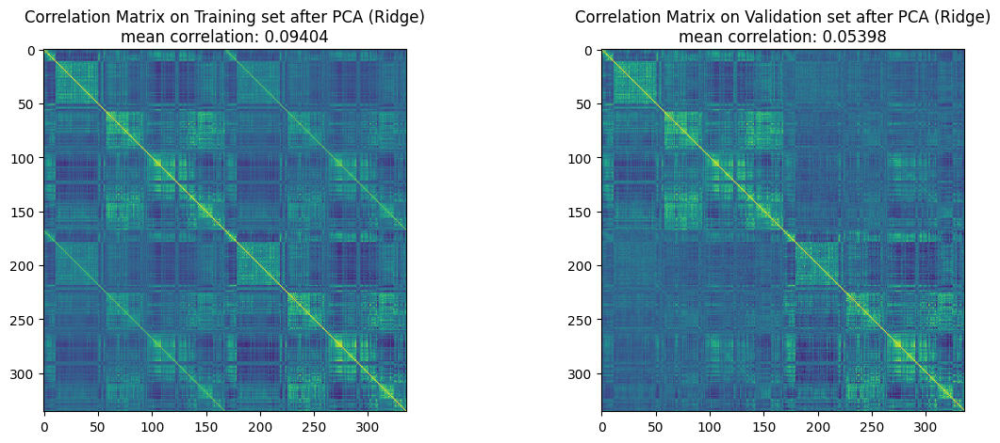

In [ ]:
# --- Correlation for Ridge after PCA ---
corr_matrix_train_ridge_pca = np.corrcoef(spikes_train, spikes_pred_train_ridge_pca, rowvar=False)
corr_matrix_val_ridge_pca = np.corrcoef(spikes_val, spikes_pred_val_ridge_pca, rowvar=False)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].imshow(corr_matrix_train_ridge_pca)
axes[0].set_title(f"Correlation Matrix on Training set after PCA (Ridge)\nmean correlation: {round(np.mean(corr_matrix_train_ridge_pca), 5)}")
axes[1].imshow(corr_matrix_val_ridge_pca)
axes[1].set_title(f"Correlation Matrix on Validation set after PCA (Ridge)\nmean correlation: {round(np.mean(corr_matrix_val_ridge_pca), 5)}")
plt.show()

**For Both Regressions**: <br>
For both training and validation data, the autocorrelation (quarters on the diagonals) are similar.  <br>
However, in the validation data, there remains little to no correlation between the true and predicted neuron traces (off-diagonal quadrants). This once again highlights that the model has overfitted to the training data and continues to struggle with generalization to unseen examples, even after model complexity was reduced through PCA.


## We try to improve the prediction using ridge regression by finding the best parameter with cross-fold validation :

In [15]:
# --- RidgeCV ---
alphas = np.logspace(-100, 100, 20)
ridge_cv = RidgeCV(alphas=alphas, store_cv_results=True)
ridge_cv.fit(stimulus_train_pca, spikes_train)

# --- Score of RidgeCV after PCA ---
print(f"RidgeCV score on training data = {ridge_cv.score(stimulus_train_pca, spikes_train)}")
print(f"RidgeCV score on validation data = {ridge_cv.score(stimulus_val_pca, spikes_val)}")
print(f"RidgeCV best alpha = {ridge_cv.alpha_}")

# --- Predictions of RidgeCV after PCA ---
spikes_pred_train_ridge_cv = ridge_cv.predict(stimulus_train_pca)
spikes_pred_val_ridge_cv = ridge_cv.predict(stimulus_val_pca)

# --- Explained variance score for each neuron of RidgeCV after PCA ---
ev_train_ridge_cv = explained_variance_score(spikes_train, spikes_pred_train_ridge_cv, multioutput='raw_values')
ev_val_ridge_cv = explained_variance_score(spikes_val, spikes_pred_val_ridge_cv, multioutput='raw_values')

RidgeCV score on training data = 0.21448715671932003
RidgeCV score on validation data = 0.08683620539570877
RidgeCV best alpha = 183298.07108324676


By tuning the alpha parameter, we achieve a positive but still low explained variance score on the test data. This indicates that the RidgeCV model overfits less than the previous models, with a lower training score and a higher (though still modest) validation score.

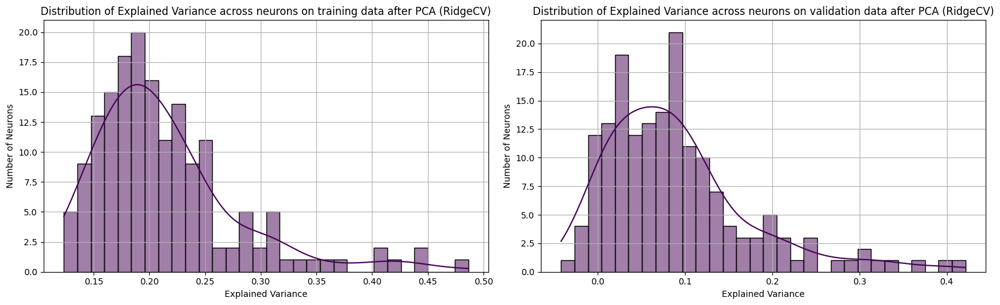

Mean explained variance 0.09083792700631707


In [38]:
# --- Plot distributions of explained variance after PCA (RidgeCV) ---
fig, axes = plt.subplots(1, 2, figsize=(16, 5))

# Distribution of Explained Variance : Training data
sns.histplot(ev_train_ridge_cv, bins=30, kde=True, ax=axes[0])
axes[0].set_xlabel("Explained Variance")
axes[0].set_ylabel("Number of Neurons")
axes[0].set_title("Distribution of Explained Variance across neurons on training data after PCA (RidgeCV)")
axes[0].grid(True)

# Distribution of Explained Variance : Validation data
sns.histplot(ev_val_ridge_cv, bins=30, kde=True, ax=axes[1])
axes[1].set_xlabel("Explained Variance")
axes[1].set_ylabel("Number of Neurons")
axes[1].set_title("Distribution of Explained Variance across neurons on validation data after PCA (RidgeCV)")
axes[1].grid(True)

plt.tight_layout()
plt.show()
print('Mean explained variance ' + str(np.mean(ev_val_ridge_cv)))



The distributions of explained variance confirm that the overfitting issue persists even though now the scores are positive on the validation data (but still centered around very low values).



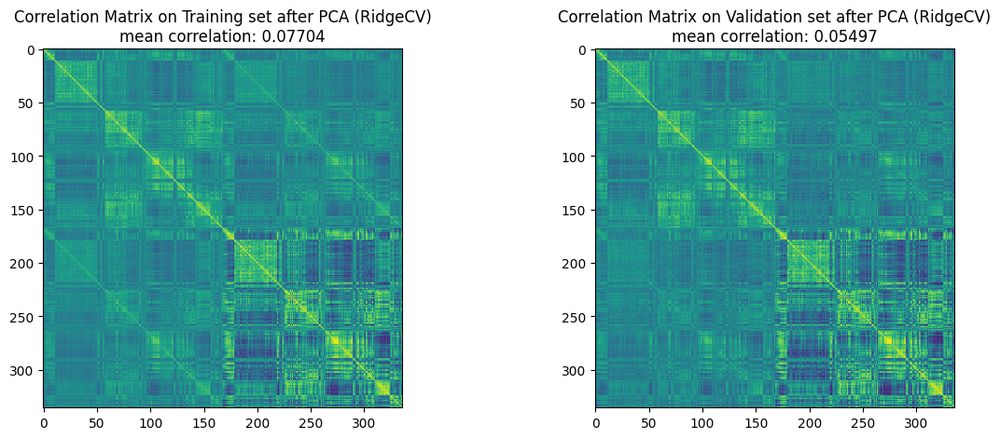

In [17]:
# --- Correlation for RidgeCV after PCA ---
corr_matrix_train_ridge_cv = np.corrcoef(spikes_train, spikes_pred_train_ridge_cv, rowvar=False)
corr_matrix_val_ridge_cv = np.corrcoef(spikes_val, spikes_pred_val_ridge_cv, rowvar=False)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].imshow(corr_matrix_train_ridge_cv)
axes[0].set_title(f"Correlation Matrix on Training set after PCA (RidgeCV)\nmean correlation: {round(np.mean(corr_matrix_train_ridge_cv), 5)}")
axes[1].imshow(corr_matrix_val_ridge_cv)
axes[1].set_title(f"Correlation Matrix on Validation set after PCA (RidgeCV)\nmean correlation: {round(np.mean(corr_matrix_val_ridge_cv), 5)}")
plt.show()

 **For Both Regressions**: <br>
For both training and validation data, the autocorrelation (quarters on the diagonals) are similar.  <br>
In the validation data, we begin to notice correlation between the true and predicted neuron traces (off-diagonal quadrants). <br>
It is very subtle and it once again highlights that the model has overfitted to the training data and continues to struggle with generalization to unseen examples.

# Part 2 - Predicting neural activity with a task-driven modeling approach


## With default initialization :

In [3]:
# --- Stimulus to tensor type ---
stimulus_tensors = torch.tensor(np.concatenate((stimulus_train, stimulus_val)))

# --- Load pretrained model ---
resnet_pretrained = models.resnet50(weights='DEFAULT')

# --- Extract activations ---
return_nodes = {
    'conv1': 'conv1',
    'layer1': 'layer1',
    'layer2': 'layer2',
    'layer3': 'layer3',
    'layer4': 'layer4',
    'avgpool': 'avgpool'
}
model_pretrained = create_feature_extractor(resnet_pretrained, return_nodes=return_nodes)

# --- Compute the 1000 PCs for each layer activation ---
layer_pc = {}
n_components = 1000
for layer in return_nodes.values():
    print(f"Extracting layer: {layer}")
    acts = []
    for img in stimulus_tensors:
        out = model_pretrained(img.unsqueeze(0))
        feature = out[layer].squeeze().cpu().detach().numpy()
        acts.append(feature.flatten())
    acts = np.stack(acts)
    pca = PCA(n_components=n_components)

    pcs = pca.fit_transform(acts)
    layer_pc[layer] = pcs


Extracting layer: conv1
Extracting layer: layer1
Extracting layer: layer2
Extracting layer: layer3
Extracting layer: layer4
Extracting layer: avgpool


In [6]:
warnings.filterwarnings("ignore")

In [7]:
# --- Using the PCs of each layer to predict the neural activity using RidgeCV ---
train_predictions = {}
val_predictions = {}
alphas = np.logspace(-100, 100, 20)

model = sklearn.linear_model.RidgeCV(alphas=alphas, store_cv_values=True)


for layer in layer_pc.keys():
    print('Layer ' + layer)
    train_activations = layer_pc[layer][0:stimulus_train.shape[0]]
    test_activations = layer_pc[layer][stimulus_train.shape[0]:]
    model.fit(train_activations, spikes_train)

    score_train = model.score(train_activations, spikes_train)
    score = model.score(test_activations, spikes_val)
    pred = model.predict(test_activations)
    mse = sklearn.metrics.mean_squared_error(spikes_val, pred)
    pred_train = model.predict(train_activations)
    train_predictions[layer] = pred_train
    val_predictions[layer] = pred

    print(f"Train R2: {round(score_train, 5)}; Test R2: {round(score, 5)}; "
        f"Test MSE: {round(mse, 5)}; Best alpha: {model.alpha_}")
    print("")

Layer conv1
Train R2: 0.0; Test R2: -0.00475; Test MSE: 0.14094; Best alpha: 6158482110660380.0

Layer layer1
Train R2: 0.60702; Test R2: 0.11776; Test MSE: 0.11377; Best alpha: 183298.07108324676

Layer layer2
Train R2: 0.61468; Test R2: 0.23928; Test MSE: 0.09748; Best alpha: 183298.07108324676

Layer layer3
Train R2: 0.54892; Test R2: 0.33547; Test MSE: 0.08534; Best alpha: 183298.07108324676

Layer layer4
Train R2: 0.28622; Test R2: 0.18683; Test MSE: 0.11132; Best alpha: 183298.07108324676

Layer avgpool
Train R2: 0.00068; Test R2: -0.0042; Test MSE: 0.14086; Best alpha: 183298.07108324676



The prediction of neural activity has improved compared to previous models. <br>

For Ridge regression on the principal components (PCs) of the stimulus, the performance metrics are as follows:
- Train R² = 0.21176, Test R² = 0.08702, and Test MSE = 0.12623.

For the best-performing layer, the results are:
- Train R² = 0.54539, Test R² = 0.33661, and Test MSE = 0.08545.

While there is still overfitting, the model shows better overall performance, with improved scores for both the training and test datasets.

## Further evalution of the goodness of the fit (default initialization) :

Layer conv1 mean validation explained variance 4.484979106552814e-08
Layer layer1 mean validation explained variance 0.12112595055725214
Layer layer2 mean validation explained variance 0.24228406089375942
Layer layer3 mean validation explained variance 0.3385139873602733
Layer layer4 mean validation explained variance 0.19134737600167784
Layer avgpool mean validation explained variance 0.0005532441004039785


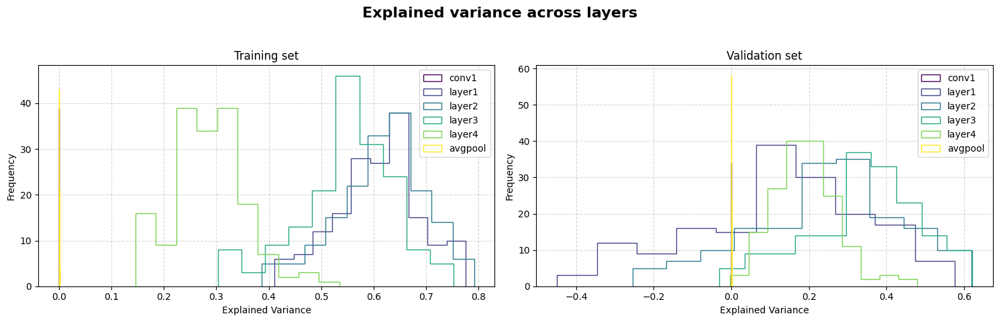

In [8]:
plt.rcParams["axes.prop_cycle"] = plt.cycler("color", plt.cm.viridis(np.linspace(0,1,len( layer_pc.keys()) )))

fig, axes = plt.subplots(1, 2, figsize=(15, 5))
fig.suptitle("Explained variance across layers", fontsize=16, fontweight='bold')

for layer in layer_pc.keys():
    explained_variance_train = explained_variance_score(spikes_train, train_predictions[layer], multioutput='raw_values')
    explained_variance_val = explained_variance_score(spikes_val, val_predictions[layer], multioutput='raw_values')
    print('Layer ' + layer + ' mean validation explained variance ' + str(np.mean(explained_variance_val)))
    axes[0].hist(explained_variance_train, label = layer, histtype = 'step')
    axes[0].set_title("Training set")
    axes[1].hist(explained_variance_val, label = layer, histtype = 'step')
    axes[1].set_title("Validation set")
axes[0].legend()
axes[1].legend()

####
for ax in axes:
    ax.set_xlabel("Explained Variance")
    ax.set_ylabel("Frequency")
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
####

plt.show()

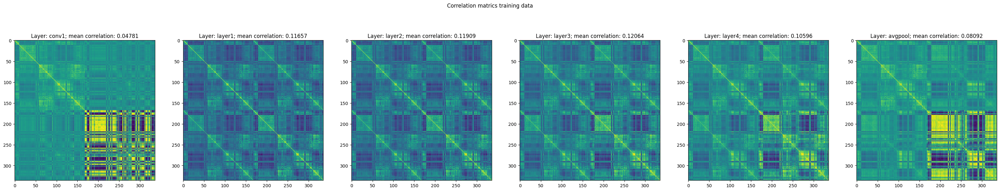

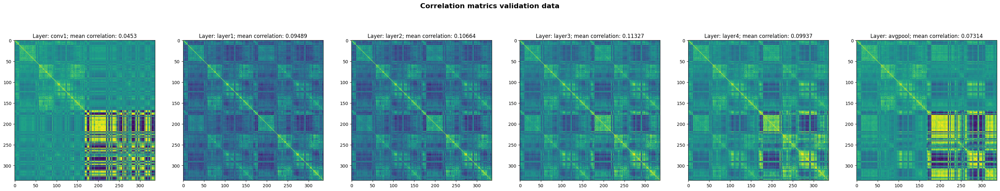

In [26]:
fig, axes = plt.subplots(1, 6, figsize=(40, 7))
i = 0

for layer in layer_pc.keys():
    corr_matrix = np.corrcoef(spikes_train,  train_predictions[layer], rowvar=False)
    axes[i].imshow(corr_matrix)
    axes[i].set_title(f"Layer: {layer}; mean correlation: {round(np.mean(corr_matrix), 5)}")
    i += 1
plt.suptitle("Correlation matrics training data")
plt.show()

fig, axes = plt.subplots(1, 6, figsize=(40, 7))
i = 0

for layer in layer_pc.keys():
    corr_matrix_val = np.corrcoef(spikes_val,  val_predictions[layer], rowvar=False)
    axes[i].imshow(corr_matrix_val)
    axes[i].set_title(f"Layer: {layer}; mean correlation: {round(np.mean(corr_matrix_val), 5)}")
    i += 1
plt.suptitle("Correlation matrics validation data", fontsize=16, fontweight='bold')
plt.show()


The prediction performance on the validation set is low for the first and last layers, while it remains relatively consistent and good for the middle layers, as observed from the correlation and variance. This may be due to the network being trained to recognize images: the first layer likely captures lower-level features typical of early visual processing (e.g., in V1), which may not align with the data from higher-level IT neurons. Similarly, the last layer, being highly specialized for the task the network was trained on, may focus on features too abstract or high-level to correspond to the activity of IT neurons.

## With random initialization :

In [30]:
resnet_not_pretrained = models.resnet50()


model_not_pretrained = create_feature_extractor(resnet_not_pretrained, return_nodes=return_nodes)
n_components = 1000
layer = 'layer3'
print(f"Extracting layer: {layer}")
acts = []
for img in stimulus_tensors:
    out = model_not_pretrained(img.unsqueeze(0))
    feature = out[layer].squeeze().cpu().detach().numpy()
    acts.append(feature.flatten())
acts = np.stack(acts)
pca = PCA(n_components=n_components)

pcs_not_trained = pca.fit_transform(acts)


Extracting layer: layer3


In [31]:
model = sklearn.linear_model.RidgeCV(alphas=alphas, store_cv_values=True)

train_activations = pcs_not_trained[0:stimulus_train.shape[0]]
test_activations = pcs_not_trained[stimulus_train.shape[0]:]
model.fit(train_activations, spikes_train)

score_train = model.score(train_activations, spikes_train)
score = model.score(test_activations, spikes_val)
pred = model.predict(test_activations)
mse = sklearn.metrics.mean_squared_error(spikes_val, pred)
pred_train = model.predict(train_activations)


print(f"Train R2: {round(score_train, 5)}; Test R2: {round(score, 5)}; "
    f"Test MSE: {round(mse, 5)}; Best alpha: {model.alpha_}")

Train R2: 0.47607; Test R2: 0.02924; Test MSE: 0.13191; Best alpha: 183298.07108324676


## Further evalution of the goodness of the fit (random initialization) :

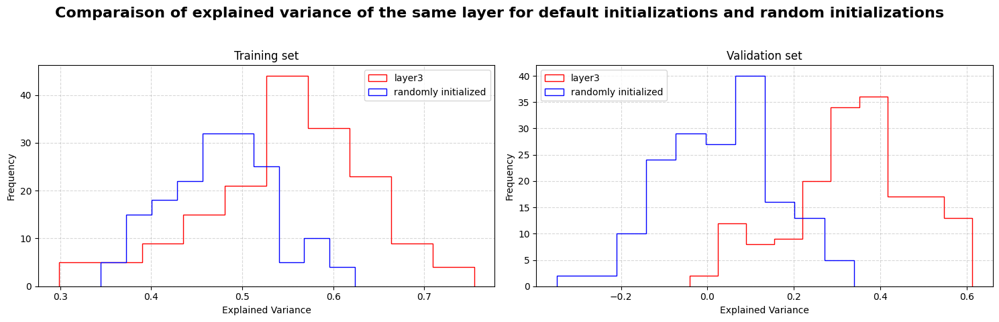

 mean validation explained variance for random layer 0.03380252286620665
 mean validation explained variance for pretrained layer 0.33946119785487133


In [44]:
layer = 'layer3'

fig, axes = plt.subplots(1, 2, figsize=(15, 5))
fig.suptitle("Comparaison of explained variance of the same layer for default initializations and random initializations", fontsize=16, fontweight='bold')

explained_variance_train = explained_variance_score(spikes_train, train_predictions[layer], multioutput='raw_values')
explained_variance_val = explained_variance_score(spikes_val, val_predictions[layer], multioutput='raw_values')
explained_variance_train_r = explained_variance_score(spikes_train, pred_train, multioutput='raw_values')
explained_variance_val_r = explained_variance_score(spikes_val, pred, multioutput='raw_values')
axes[0].hist(explained_variance_train, label = layer, histtype = 'step', color = 'red')
axes[0].hist(explained_variance_train_r, label = 'randomly initialized', histtype = 'step', color = 'b')
axes[0].set_title("Training set")
axes[1].hist(explained_variance_val, label = layer, histtype = 'step', color = 'red')
axes[1].hist(explained_variance_val_r, label = 'randomly initialized', histtype = 'step', color = 'b')
axes[1].set_title("Validation set")
axes[0].legend()
axes[1].legend()

####
for ax in axes:
    ax.set_xlabel("Explained Variance")
    ax.set_ylabel("Frequency")
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
####

plt.show()

print(' mean validation explained variance for random layer ' + str(np.mean(explained_variance_val_r)))
print(' mean validation explained variance for pretrained layer ' + str(np.mean(explained_variance_val)))



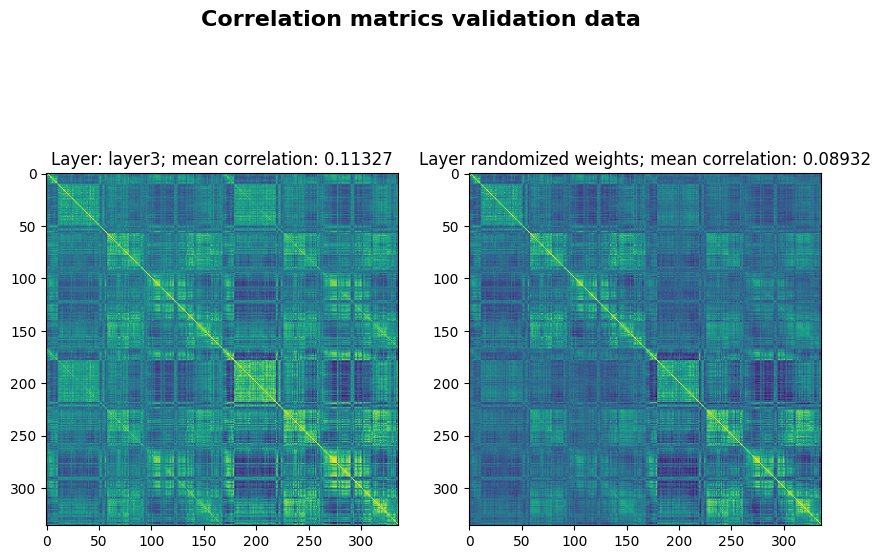

In [46]:
fig, axes = plt.subplots(1, 2, figsize=(10, 7))
corr_matrix = np.corrcoef(spikes_val,  val_predictions[layer], rowvar=False)
axes[0].imshow(corr_matrix)
axes[0].set_title(f"Layer: {layer}; mean correlation: {round(np.mean(corr_matrix), 5)}")
corr_matrix = np.corrcoef(spikes_val,  pred, rowvar=False)
axes[1].imshow(corr_matrix)
axes[1].set_title(f"Layer randomized weights; mean correlation: {round(np.mean(corr_matrix), 5)}")

i += 1
plt.suptitle("Correlation matrics validation data", fontsize=16, fontweight='bold')
plt.show()

The randomly initialized layer performs worse than the trained network, with a higher MSE (0.13 compared to 0.08) and a lower validation score (13 vs 33).

Additionally, the explained variance is lower for the randomly initialized network, and the correlation matrix shows high correlation between predicted spikes but low correlation with the actual spikes.

Overall, while the randomly weighted layers outperform a simple PCA of the stimulus in extracting some meaningful features, a trained network for object classification provides even better predictions of IT spike trains.

# Part 3 - Predicting neural activity using a data-driven approach


In [140]:
# --- Use GPU is available ---
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

Custom PyTorch dataset to pair images with neural recordings : 

In [141]:
# --- Dataset Setup ---

class ITDataset(Dataset):
    def __init__(self, image_list, neural_data, transform=None):
        self.image_list = image_list
        self.neural_data = torch.tensor(neural_data, dtype=torch.float32)
        self.transform = transform if transform else transforms.ToTensor()

    def __len__(self):
        return len(self.image_list)

    def __getitem__(self, idx):
        img = self.image_list[idx]

        if isinstance(img, np.ndarray):
            if img.ndim != 3 or img.shape[0] != 3:
                raise ValueError(f"Unexpected image shape: {img.shape}")
            img = torch.from_numpy(img).float()

        return img, self.neural_data[idx]

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

Create DataLoaders for training and validation with batching and shuffling : 

In [142]:
# --- Train loader and Validation loader ---

# Train
dataset_train = ITDataset(stimulus_train, spikes_train)
loader_train = DataLoader(dataset_train, batch_size=32, shuffle=True)

# Validation
dataset_val = ITDataset(stimulus_val, spikes_val)
loader_val = DataLoader(dataset_val, batch_size=32, shuffle=True)

# Full dataset
dataset = ITDataset(np.concatenate((stimulus_train, stimulus_val), axis = 0), np.concatenate((spikes_train, spikes_val), axis = 0))

We define a simple CNN with three convolutional blocks followed by fully connected layers :

In [143]:
# --- The Network ---

class ShallowCNN(nn.Module):
    def __init__(self, output_size):
        super(ShallowCNN, self).__init__()

        self.conv_layers = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=5, stride=2, padding=2),
            nn.ReLU(),
            nn.MaxPool2d(2),

            nn.Conv2d(16, 32, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
            nn.AdaptiveAvgPool2d(2),

            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.AdaptiveAvgPool2d((4, 4))
        )

        self.flattened_size = 64 * 4 * 4

        self.fc_layers = nn.Sequential(
            nn.Linear(self.flattened_size, 512),
            nn.ReLU(),
            nn.Linear(512, output_size)  # output_size = number of neurons you're predicting
        )

    def forward(self, x):
        x = self.conv_layers(x)
        x = x.view(x.size(0), -1)  # flatten
        x = self.fc_layers(x)
        return x

In [144]:
shallow_cnn = ShallowCNN(output_size=spikes_train.shape[1])
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(shallow_cnn.parameters(), lr=1e-3)

We train the CNN over multiple epochs using training data, and evaluate performance on validation data to track learning progress : 

In [145]:
# --- Training and validation Loop ---

shallow_cnn.to(device)

EPOCHS = 30

val_losses = []
train_losses = []

for epoch in tqdm(range(EPOCHS)):
    shallow_cnn.train()
    running_loss = 0.0
    for imgs, targets in loader_train:
        imgs, targets = imgs.to(device), targets.to(device)
        optimizer.zero_grad()
        outputs = shallow_cnn(imgs)
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    epoch_train_loss = running_loss / len(loader_train)
    train_losses.append(epoch_train_loss)

    # Validation mode
    shallow_cnn.eval()
    val_loss = 0.0
    with torch.no_grad():
        for imgs, targets in loader_val:
            imgs, targets = imgs.to(device), targets.to(device)
            outputs = shallow_cnn(imgs)
            loss = criterion(outputs, targets)
            val_loss += loss.item()
    epoch_val_loss = val_loss / len(loader_val)
    val_losses.append(epoch_val_loss)

100%|██████████| 30/30 [01:01<00:00,  2.06s/it]


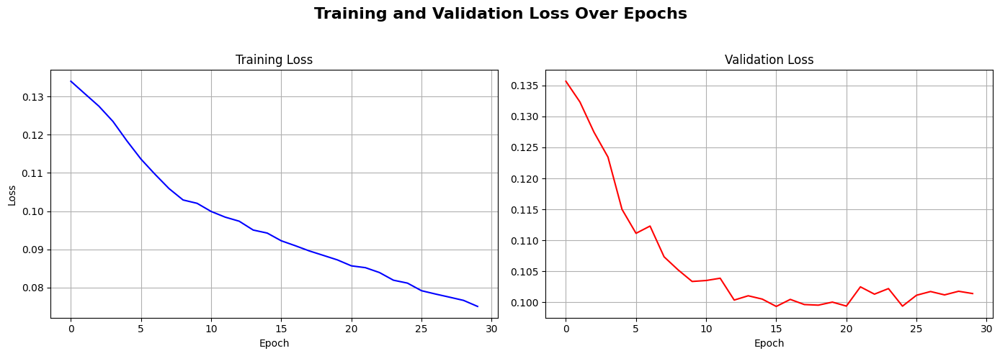

In [146]:
# --- Plot : training and validation loss ---

fig, axes = plt.subplots(1, 2, figsize=(14, 5), sharey=False)

# training loss
axes[0].plot(train_losses, color='blue')
axes[0].set_title("Training Loss")
axes[0].set_xlabel("Epoch")
axes[0].set_ylabel("Loss")
axes[0].grid(True)

# validation loss
axes[1].plot(val_losses, color='red')
axes[1].set_title("Validation Loss")
axes[1].set_xlabel("Epoch")
axes[1].grid(True)

fig.suptitle("Training and Validation Loss Over Epochs", fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


Both training and validation losses decrease over epochs, which suggests that the model is learning effectively. <br>
The validation loss remains slightly higher than the training loss, as expected, but the gap is small. <br>
This may indicate limited overfitting, but we have to investigate more to make sure.

Now we extract intermediate activations from key convolutional and fully connected layers to inspect learned representations. Then, we evaluate model predictions using explained variance, correlation, and mean squared error (MSE) : 

In [147]:
# --- Extract activations ---
activations = {}

def get_activation(name):
    def hook(model, input, output):
        activations[name] = output.detach()
    return hook

shallow_cnn.conv_layers[0].register_forward_hook(get_activation('conv1'))
shallow_cnn.conv_layers[3].register_forward_hook(get_activation('conv2'))
shallow_cnn.conv_layers[6].register_forward_hook(get_activation('conv3'))
shallow_cnn.fc_layers[0].register_forward_hook(get_activation('fc1'))
shallow_cnn.fc_layers[1].register_forward_hook(get_activation('fc2'))


imgs = torch.stack([img for img, _ in dataset])
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
shallow_cnn = shallow_cnn.to(device)
imgs = imgs.to(device)
output = shallow_cnn(imgs)

In [148]:
labels =  torch.stack([label for _, label in dataset])
labels = labels.to("cpu")
output = output.to("cpu").detach().numpy()

training_labels = labels[:stimulus_train.shape[0]]
testing_labels = labels[stimulus_train.shape[0]:]
training_output = output[:stimulus_train.shape[0]]
testing_output = output[stimulus_train.shape[0]:]

ev_training = explained_variance_score(training_labels, training_output, multioutput='raw_values')
ev_testing = explained_variance_score(testing_labels, testing_output, multioutput='raw_values')

corr_matrix_training = np.corrcoef(spikes_train,  training_output, rowvar=False)
corr_matrix_testing = np.corrcoef(spikes_val,  testing_output, rowvar=False)
mse = sklearn.metrics.mean_squared_error(spikes_train, training_output)
print('Training mse ' + str(mse))
mse = sklearn.metrics.mean_squared_error(spikes_val, testing_output)
print('Testing mse ' + str(mse))

Training mse 0.07176477462053299
Testing mse 0.10142850875854492


The training MSE is noticeably lower than the testing MSE, suggesting that the model may actually be overfitting to the training data.

In [149]:
layer_pc = {}
n_components = 1000  # adjust as needed

for layer, act in tqdm(activations.items()):
    # act: shape (N, C, H, W) or (N, D) depending on the layer
    act = act.cpu().detach().numpy()

    if act.ndim > 2:
        # Flatten spatial dimensions: (N, C, H, W) → (N, C*H*W)
        act = act.reshape(act.shape[0], -1)

    pca = PCA(n_components=min(n_components, act.shape[1]))
    pcs = pca.fit_transform(act)
    layer_pc[layer] = pcs


100%|██████████| 5/5 [03:10<00:00, 38.11s/it] 


In [150]:
train_predictions = {}
val_predictions = {}

alphas = np.logspace(-12, 12, 26)
ridge = sklearn.linear_model.RidgeCV(alphas=alphas, store_cv_results=True)

results = []

for layer in layer_pc.keys():
    train_activations = layer_pc[layer][0:stimulus_train.shape[0]]
    test_activations = layer_pc[layer][stimulus_train.shape[0]:]
    ridge.fit(train_activations, spikes_train)

    score_train = ridge.score(train_activations, spikes_train)
    score = ridge.score(test_activations, spikes_val)
    pred = ridge.predict(test_activations)
    mse = sklearn.metrics.mean_squared_error(spikes_val, pred)
    pred_train = ridge.predict(train_activations)
    train_predictions[layer] = pred_train
    val_predictions[layer] = pred

    results.append({
        "Layer": layer,
        "Train R²": score_train,
        "Test R²": score,
        "Test MSE": mse,
        "Best alpha": ridge.alpha_
    })

# Create and display summary table
results_df = pd.DataFrame(results)
display(results_df)


,Layer,Train R²,Test R²,Test MSE,Best alpha
0,conv1,0.266699,0.090113,0.125689,190546.071796
1,conv2,0.247911,0.171454,0.112937,190546.071796
2,conv3,0.255732,0.214186,0.105684,0.331131
3,fc1,0.361105,0.238801,0.101774,3.019952
4,fc2,0.456450,0.232116,0.102335,3.019952


This table indictaes that overfitting remains noticeable, and overall performance on the validation set is still limited.

Layer conv1 mean validation explained variance 0.09399445990770497
Layer conv2 mean validation explained variance 0.17517094715995823
Layer conv3 mean validation explained variance 0.2189872902691769
Layer fc1 mean validation explained variance 0.2427419459592923
Layer fc2 mean validation explained variance 0.2365386934670146


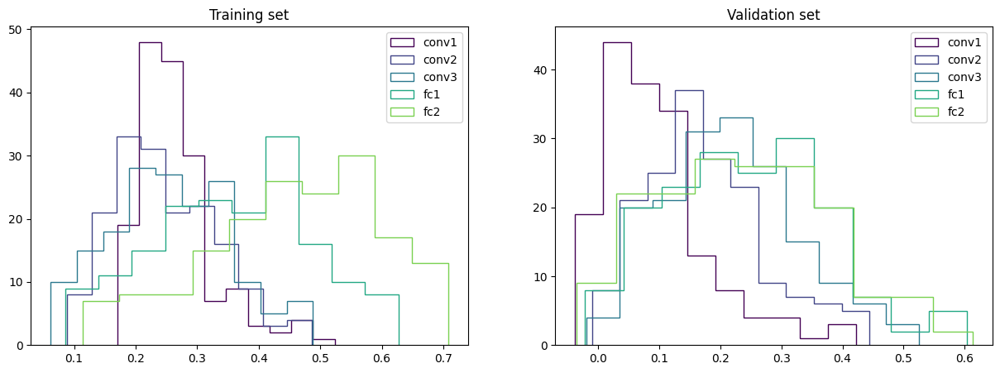

In [151]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

for layer in layer_pc.keys():
    
    explained_variance_train = explained_variance_score(spikes_train, train_predictions[layer], multioutput='raw_values')
    explained_variance_val = explained_variance_score(spikes_val, val_predictions[layer], multioutput='raw_values')
    print('Layer ' + layer + ' mean validation explained variance ' + str(np.mean(explained_variance_val)))

    axes[0].hist(explained_variance_train, label = layer, histtype = 'step')
    axes[0].set_title("Training set")
    axes[1].hist(explained_variance_val, label = layer, histtype = 'step')
    axes[1].set_title("Validation set")
axes[0].legend()
axes[1].legend()
plt.show()

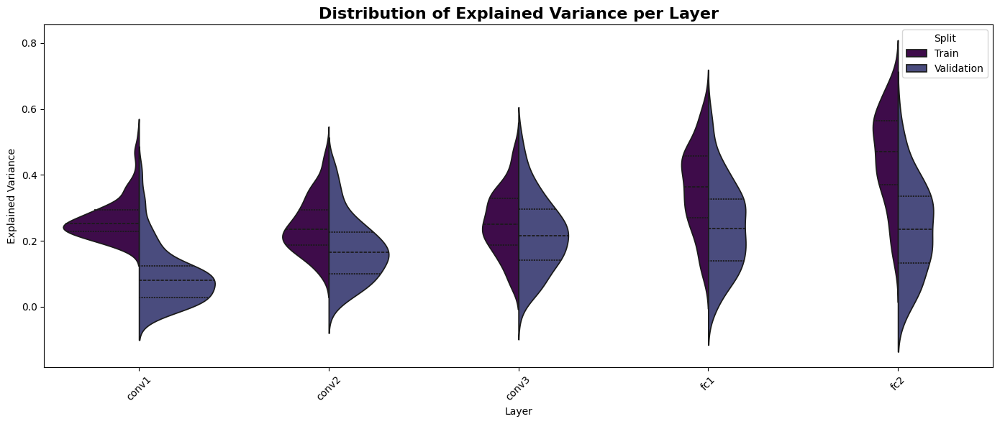

In [152]:
data = []
for layer in layer_pc.keys():
    ev_train = explained_variance_score(spikes_train, train_predictions[layer], multioutput='raw_values')
    ev_val = explained_variance_score(spikes_val, val_predictions[layer], multioutput='raw_values')
    data.extend([(layer, "Train", ev) for ev in ev_train])
    data.extend([(layer, "Validation", ev) for ev in ev_val])

df = pd.DataFrame(data, columns=["Layer", "Split", "Explained Variance"])

# Plot
plt.figure(figsize=(14, 6))
sns.violinplot(data=df, x="Layer", y="Explained Variance", hue="Split", split=True, inner="quartile")
plt.title("Distribution of Explained Variance per Layer", fontsize=16, fontweight='bold')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Expected variance is still centered around 0.2 across layers for the validation data. This suggests that the model captures only a modest portion of the neural variability, indicating there is still room for improvement in generalization.

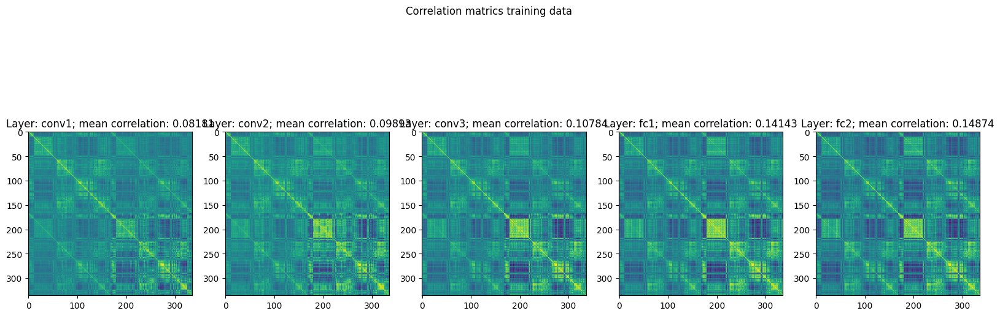

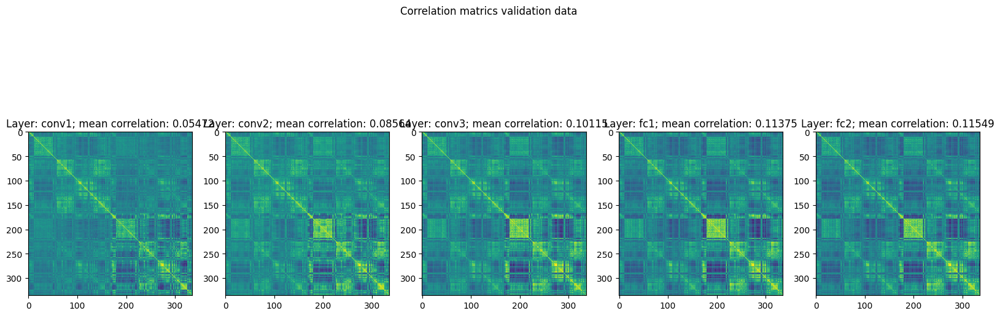

In [155]:
fig, axes = plt.subplots(1, 5, figsize=(20, 7))
plt.suptitle(' 4 layers CNN')

i = 0

for layer in layer_pc.keys():
    corr_matrix = np.corrcoef(spikes_train,  train_predictions[layer], rowvar=False)
    axes[i].imshow(corr_matrix)
    axes[i].set_title(f"Layer: {layer}; mean correlation: {round(np.mean(corr_matrix), 5)}")
    i += 1
plt.suptitle("Correlation matrics training data")
plt.show()

fig, axes = plt.subplots(1, 5, figsize=(20, 7))
i = 0

for layer in layer_pc.keys():
    corr_matrix_val = np.corrcoef(spikes_val,  val_predictions[layer], rowvar=False)
    axes[i].imshow(corr_matrix_val)
    axes[i].set_title(f"Layer: {layer}; mean correlation: {round(np.mean(corr_matrix_val), 5)}")
    i += 1
plt.suptitle("Correlation matrics validation data")
plt.show()

The correlation matrices across layers reveal strong internal consistency between predicted spike patterns, but the correlation with actual neural data remains low.

The tables and plots suggest that, while performance has improved compared to earlier stages of the project, the model still exhibits signs of overfitting. <br>

In the next section, we explore alternative architectures in an effort to improve generalization and overall performance.